# ENDOMETRIOSIS DETECTION WITH EFFICIENTDET D0 MODEL

## IMPORT REQUIRED LIBRARIES

In [2]:
import tensorflow as tf
print("Tensor version" + tf.__version__)
print(tf.config.list_physical_devices('GPU'))

import json
import shutil
import os
from sklearn.model_selection import train_test_split
import imgaug.augmenters as iaa
import imgaug as ia
import imageio
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage

from object_detection.utils import dataset_util, label_map_util
from object_detection.dataset_tools import create_coco_tf_record
from object_detection.dataset_tools import tf_record_creation_util
from object_detection.dataset_tools import create_coco_tf_record

import pathlib
import matplotlib
import matplotlib.pyplot as plt

import random
import io
import glob
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage

from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder

%matplotlib inline
import matplotlib.patches as patches
import re
from PIL import Image

Tensor version2.13.1
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## DATA LOADING AND PREPROCESSING

In [8]:

# Load the COCO annotation file
with open('/home/759635/Glenda_v1.5_classes/coco.json') as f:
    coco_data = json.load(f)

# Extract the images and annotations
images = coco_data['images']
annotations = coco_data['annotations']

# Split the images into training, validation, and testing sets
train_images, test_images = train_test_split(images, test_size=0.3, random_state=42)
val_images, test_images = train_test_split(test_images, test_size=(1/3), random_state=42)

# Function to filter annotations by image ids
def filter_annotations(annotations, images):
    image_ids = [image['id'] for image in images]
    return [annotation for annotation in annotations if annotation['image_id'] in image_ids]

# Filter the annotations for each dataset split
train_annotations = filter_annotations(annotations, train_images)
val_annotations = filter_annotations(annotations, val_images)
test_annotations = filter_annotations(annotations, test_images)

# Create the COCO data for each split
def create_coco_split(images, annotations, categories, info):
    return {
        "images": images,
        "annotations": annotations,
        "categories": coco_data['categories'],
        "info": coco_data['info'],
    }

train_coco = create_coco_split(train_images, train_annotations, coco_data['categories'], coco_data['info'])
val_coco = create_coco_split(val_images, val_annotations, coco_data['categories'], coco_data['info'])
test_coco = create_coco_split(test_images, test_annotations, coco_data['categories'], coco_data['info'])

# Save the COCO data for each split to new JSON files
with open('/home/759635/Glenda_v1.5_classes/train_coco.json', 'w') as f:
    json.dump(train_coco, f)
with open('/home/759635/Glenda_v1.5_classes/val_coco.json', 'w') as f:
    json.dump(val_coco, f)
with open('/home/759635/Glenda_v1.5_classes/test_coco.json', 'w') as f:
    json.dump(test_coco, f)

# Copy the images to respective train, val, and test directories
def copy_images(images, source_dir, dest_dir):
    os.makedirs(dest_dir, exist_ok=True)
    for image in images:
        file_name = image['file_name']
        shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_dir, file_name))

copy_images(train_images, '/home/759635/Glenda_v1.5_classes/frames', '/home/759635/Glenda_v1.5_classes/train_frames')
copy_images(val_images, '/home/759635/Glenda_v1.5_classes/frames', '/home/759635/Glenda_v1.5_classes/val_frames')
copy_images(test_images, '/home/759635/Glenda_v1.5_classes/frames', '/home/759635/Glenda_v1.5_classes/test_frames')


I used the train_test_split function from sklearn.model_selection to randomly split the images and then match the annotations to the split images.
I then write new COCO JSON files for each dataset split. Train images are 256,  while Validation images are 84, and Test images are 38. Making it a ratio of 68:22:10

In [3]:
# !pip install imgaug

### APPLYING DATA AUGMENTATION

In [4]:
# Load your original annotations and images
def load_images_and_annotations(json_annotation_path, image_dir):
    with open(json_annotation_path) as f:
        coco_data = json.load(f)
    return coco_data

# Define your augmentation sequence
augmentation_seq = iaa.Sequential([
    iaa.Fliplr(0.5),  # 50% chance for horizontal flip
    iaa.Flipud(0.2),  # 20% chance for vertical flip
    iaa.Affine(
        scale={"x": (0.8, 1.2), "y": (0.8, 1.2)},
        translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)},
        rotate=(-25, 25)
    )
])

def augment_dataset(coco_data, image_dir, augmentation_seq):
    # Augment each image and update annotations
    for image_info in coco_data["images"]:
        image_path = os.path.join(image_dir, image_info["file_name"])
        image = imageio.imread(image_path)
        bbs = [BoundingBox(x1=ann["bbox"][0], y1=ann["bbox"][1],
                           x2=ann["bbox"][0] + ann["bbox"][2],
                           y2=ann["bbox"][1] + ann["bbox"][3])
               for ann in coco_data["annotations"] if ann["image_id"] == image_info["id"]]
        bbs = BoundingBoxesOnImage(bbs, shape=image.shape)

        # Apply augmentation
        image_aug, bbs_aug = augmentation_seq(image=image, bounding_boxes=bbs)
        image_aug_path = os.path.join(image_dir, f"aug_{image_info['file_name']}")
        imageio.imwrite(image_aug_path, image_aug)  # Save augmented image

        # Update image_info with new file name and potentially new image size
        image_info["file_name"] = f"aug_{image_info['file_name']}"
        image_info["width"], image_info["height"] = image_aug.shape[1], image_aug.shape[0]

        # Update annotations with the augmented bounding boxes
        for bb_aug, ann in zip(bbs_aug.bounding_boxes, [ann for ann in coco_data["annotations"] if ann["image_id"] == image_info["id"]]):
            ann["bbox"] = [bb_aug.x1, bb_aug.y1, bb_aug.width, bb_aug.height]

#Calling the function
coco_data = load_images_and_annotations('/home/759635/Glenda_v1.5_classes/train_coco.json', '/home/759635/Glenda_v1.5_classes/train_frames')
augment_dataset(coco_data, '/home/759635/Glenda_v1.5_classes/train_frames', augmentation_seq)


/tmp/ipykernel_39688/1492310725.py:22: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(image_path)


##### The training images became 522 after data augmentation

### CONVERTING THE CORRECTLY SPLIT IMAGES TO TENSORFLOW RECORDS FOR OBJECT DETECTION TRAINING

In [3]:
# Defining the labels / classes
labels_txt_path = '/home/759635/Glenda_v1.5_classes/labels.txt'
label_map_pbtxt_path = '/home/759635/Glenda_v1.5_classes/label_map.pbtxt'

# Read the class names from labels.txt
with open(labels_txt_path, 'r') as file:
    class_names = file.read().strip().split('\n')

# Writing the label map file
with open(label_map_pbtxt_path, 'w') as file:
    for idx, class_name in enumerate(class_names, start=1):  # Starting at 1
        file.write("item {\n")
        file.write("  id: {}\n".format(idx))
        file.write("  name: '{}'\n".format(class_name))
        file.write("}\n")


In [12]:

# Adjust these paths to your actual files
train_images_dir = '/home/759635/Glenda_v1.5_classes/train_frames'
val_images_dir = '/home/759635/Glenda_v1.5_classes/val_frames'
test_images_dir = '/home/759635/Glenda_v1.5_classes/test_frames'
train_annotations_file = '/home/759635/Glenda_v1.5_classes/train_coco.json'
val_annotations_file = '/home/759635/Glenda_v1.5_classes/val_coco.json'
test_annotations_file = '/home/759635/Glenda_v1.5_classes/test_coco.json'
output_dir = '/home/759635/Glenda_v1.5_classes/tfrecords'
label_map_file = '/home/759635/Glenda_v1.5_classes/label_map.pbtxt'

# Ensuring the output directory exists
os.makedirs(output_dir, exist_ok=True)

include_masks = True  

# Create TFRecord for training set
create_coco_tf_record._create_tf_record_from_coco_annotations(
    annotations_file=train_annotations_file,
    image_dir=train_images_dir,
    output_path=os.path.join(output_dir, 'train.record'),
    include_masks=include_masks,
    num_shards=100
)

# Create TFRecord for validation set
create_coco_tf_record._create_tf_record_from_coco_annotations(
    annotations_file=val_annotations_file,
    image_dir=val_images_dir,
    output_path=os.path.join(output_dir, 'val.record'),
    include_masks=include_masks,
    num_shards=50
)

# Create TFRecord for test set
create_coco_tf_record._create_tf_record_from_coco_annotations(
    annotations_file=test_annotations_file,
    image_dir=test_images_dir,
    output_path=os.path.join(output_dir, 'test.record'),
    include_masks=include_masks,
    num_shards=50
)


**Successfully converted the images to tfrecords.The TFRecord format is a simple format for storing a sequence of binary records**

In [14]:
# Clone the tensorflow models repository 
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

In [15]:
# Change the current working directory to the models/research/ directory using the shell command
%cd models/research/

# Compile Protocol Buffers (protobuf) Files & specifying the output directory
!protoc object_detection/protos/*.proto --python_out=.

# Copy the setup.py File to the current working directory
!cp object_detection/packages/tf2/setup.py .

# Install the Object Detection API as a Python Package
!python -m pip install .


/home/759635/models/research
Defaulting to user installation because normal site-packages is not writeable
Processing /home/759635/models/research
  Preparing metadata (setup.py) ... done


  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1655482 sha256=598177f1e5f81675863c281918d0c51ab8a5973a71d4a9ea9f7660aa0a7d5307
  Stored in directory: /tmp/pip-ephem-wheel-cache-gf4exfep/wheels/62/a8/86/9373ca9ebb24c3dc38d6010c2221ff7c231b243aadf64044f2
Successfully built object-detection
  Attempting uninstall: object-detection
    Found existing installation: object-detection 0.1
    Uninstalling object-detection-0.1:
      Successfully uninstalled object-detection-0.1


In [16]:
#run model builder test
!python /home/759635/models/research/object_detection/builders/model_builder_tf2_test.py

2023-11-08 22:03:53.165435: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-11-08 22:04:24.316338: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Running tests under Python 3.10.10: /home/ViperAppsFiles/python/anaconda/miniconda/3.10/bin/python
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2023-11-08 22:05:13.746008: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 43419 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:02:00.0, compute capability: 8.6
W1108 22:05:14.189781 140521630340928 batch_normalization.py:1531] `tf.keras.layers.experimental.SyncBatchNormalization` endpoint is deprecated and wil

I1108 22:05:20.829948 140521630340928 ssd_efficientnet_bifpn_feature_extractor.py:161] EfficientDet EfficientNet backbone version: efficientnet-b0
I1108 22:05:20.830040 140521630340928 ssd_efficientnet_bifpn_feature_extractor.py:163] EfficientDet BiFPN num filters: 64
I1108 22:05:20.830119 140521630340928 ssd_efficientnet_bifpn_feature_extractor.py:164] EfficientDet BiFPN num iterations: 3
I1108 22:05:20.832475 140521630340928 efficientnet_model.py:143] round_filter input=32 output=32
I1108 22:05:20.859372 140521630340928 efficientnet_model.py:143] round_filter input=32 output=32
I1108 22:05:20.859458 140521630340928 efficientnet_model.py:143] round_filter input=16 output=16
I1108 22:05:20.931823 140521630340928 efficientnet_model.py:143] round_filter input=16 output=16
I1108 22:05:20.931910 140521630340928 efficientnet_model.py:143] round_filter input=24 output=24
I1108 22:05:21.117547 140521630340928 efficientnet_model.py:143] round_filter input=24 output=24
I1108 22:05:21.117636 140

I1108 22:05:24.432147 140521630340928 efficientnet_model.py:143] round_filter input=16 output=16
I1108 22:05:24.432234 140521630340928 efficientnet_model.py:143] round_filter input=24 output=24
I1108 22:05:24.861056 140521630340928 efficientnet_model.py:143] round_filter input=24 output=24
I1108 22:05:24.861223 140521630340928 efficientnet_model.py:143] round_filter input=40 output=48
I1108 22:05:25.115785 140521630340928 efficientnet_model.py:143] round_filter input=40 output=48
I1108 22:05:25.115876 140521630340928 efficientnet_model.py:143] round_filter input=80 output=88
I1108 22:05:25.456389 140521630340928 efficientnet_model.py:143] round_filter input=80 output=88
I1108 22:05:25.456482 140521630340928 efficientnet_model.py:143] round_filter input=112 output=120
I1108 22:05:25.795391 140521630340928 efficientnet_model.py:143] round_filter input=112 output=120
I1108 22:05:25.795482 140521630340928 efficientnet_model.py:143] round_filter input=192 output=208
I1108 22:05:26.216464 14

I1108 22:05:30.575531 140521630340928 efficientnet_model.py:143] round_filter input=112 output=160
I1108 22:05:30.575623 140521630340928 efficientnet_model.py:143] round_filter input=192 output=272
I1108 22:05:31.478270 140521630340928 efficientnet_model.py:143] round_filter input=192 output=272
I1108 22:05:31.478437 140521630340928 efficientnet_model.py:143] round_filter input=320 output=448
I1108 22:05:31.652970 140521630340928 efficientnet_model.py:143] round_filter input=1280 output=1792
I1108 22:05:31.688668 140521630340928 efficientnet_model.py:453] Building model efficientnet with params ModelConfig(width_coefficient=1.4, depth_coefficient=1.8, resolution=380, dropout_rate=0.4, blocks=(BlockConfig(input_filters=32, output_filters=16, kernel_size=3, num_repeat=1, expand_ratio=1, strides=(1, 1), se_ratio=0.25, id_skip=True, fused_conv=False, conv_type='depthwise'), BlockConfig(input_filters=16, output_filters=24, kernel_size=3, num_repeat=2, expand_ratio=6, strides=(2, 2), se_rati

I1108 22:05:39.216858 140521630340928 ssd_efficientnet_bifpn_feature_extractor.py:161] EfficientDet EfficientNet backbone version: efficientnet-b7
I1108 22:05:39.216949 140521630340928 ssd_efficientnet_bifpn_feature_extractor.py:163] EfficientDet BiFPN num filters: 384
I1108 22:05:39.217010 140521630340928 ssd_efficientnet_bifpn_feature_extractor.py:164] EfficientDet BiFPN num iterations: 8
I1108 22:05:39.218760 140521630340928 efficientnet_model.py:143] round_filter input=32 output=64
I1108 22:05:39.236510 140521630340928 efficientnet_model.py:143] round_filter input=32 output=64
I1108 22:05:39.236595 140521630340928 efficientnet_model.py:143] round_filter input=16 output=32
I1108 22:05:39.502834 140521630340928 efficientnet_model.py:143] round_filter input=16 output=32
I1108 22:05:39.502924 140521630340928 efficientnet_model.py:143] round_filter input=24 output=48
I1108 22:05:40.072521 140521630340928 efficientnet_model.py:143] round_filter input=24 output=48
I1108 22:05:40.072611 14

In [4]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path.

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

def plot_detections(image_np,
                    boxes,
                    classes,
                    scores,
                    category_index,
                    figsize=(12, 16),
                    image_name=None):
  """Wrapper function to visualize detections.

  Args:
    image_np: uint8 numpy array with shape (img_height, img_width, 3)
    boxes: a numpy array of shape [N, 4]
    classes: a numpy array of shape [N]. Note that class indices are 1-based,
      and match the keys in the label map.
    scores: a numpy array of shape [N] or None.  If scores=None, then
      this function assumes that the boxes to be plotted are groundtruth
      boxes and plot all boxes as black with no classes or scores.
    category_index: a dict containing category dictionaries (each holding
      category index `id` and category name `name`) keyed by category indices.
    figsize: size for the figure.
    image_name: a name for the image file.
  """
  image_np_with_annotations = image_np.copy()
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates=True,
      min_score_thresh=0.8)
  if image_name:
    plt.imsave(image_name, image_np_with_annotations)
  else:
    plt.imshow(image_np_with_annotations)

In [3]:
MODELS_CONFIG = {
    'efficientdet-d0': {
        'model_name': 'efficientdet_d0_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d0_coco17_tpu-32.tar.gz',
        'batch_size': 16
    }
}

chosen_model = 'efficientdet-d0'

num_steps = 80000 #The more steps, the longer the training. 
num_eval_steps = 500 #Perform evaluation after so many steps

model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']
batch_size = MODELS_CONFIG[chosen_model]['batch_size'] 

In [25]:
#download pretrained weights
%mkdir /home/759635/models/research/deploy/
%cd /home/759635/models/research/deploy/
import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint

!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

mkdir: cannot create directory '/home/759635/models/research/deploy/': File exists
/home/759635/models/research/deploy
--2023-11-08 22:13:42--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 216.58.201.123, 216.58.204.91, 172.217.169.27, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|216.58.201.123|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30736482 (29M) [application/x-tar]
Saving to: 'efficientdet_d0_coco17_tpu-32.tar.gz'

100%[======================================>] 30,736,482  28.1MB/s   in 1.0s   

2023-11-08 22:13:43 (28.1 MB/s) - 'efficientdet_d0_coco17_tpu-32.tar.gz' saved [30736482/30736482]



In [26]:
#download base training configuration file
%cd /home/759635/models/research/deploy
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

/home/759635/models/research/deploy
--2023-11-08 22:13:45--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_efficientdet_d0_512x512_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4630 (4.5K) [text/plain]
Saving to: 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config'

100%[======================================>] 4,630       --.-K/s   in 0s      

2023-11-08 22:13:45 (30.0 MB/s) - 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config' saved [4630/4630]



In [5]:
#File paths for the pipeline configuration and fine-tune checkpoint
pipeline_fname = '/home/759635/models/research/deploy/' + base_pipeline_file
fine_tune_checkpoint = '/home/759635/models/research/deploy/' + model_name + '/checkpoint/ckpt-0'

# Function to get the number of classes from the label map file
def get_num_classes(pbtxt_fname):
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_file)


In [6]:
num_classes

4

In [31]:
'''
writing the custom configuration file by slotting the dataset, model checkpoint, and training parameters into the 
base pipeline file using regular expression

'''
train_record_pattern = '/home/759635/Glenda_v1.5_classes/tfrecords/train.record-*'
test_record_pattern = '/home/759635/Glenda_v1.5_classes/tfrecords/test.record-*'

print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()

# Path for the sharded TFRecord files (use wildcard)
train_record_fname = train_record_pattern
test_record_fname = test_record_pattern

with open('pipeline_file.config', 'w') as f:
    # Replace fine_tune_checkpoint
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)

    # Replace tfrecord files train and test with wildcard paths.
    s = re.sub('input_path: ".*?train.*?"', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub('input_path: ".*?val.*?"', 'input_path: "{}"'.format(test_record_fname), s)

    # Replace label_map_path
    s = re.sub('label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_file), s)

    # Set training batch_size.
    s = re.sub('batch_size: [0-9]+', 'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+', 'num_steps: {}'.format(num_steps), s)

    # Set number of classes num_classes.
    s = re.sub('num_classes: [0-9]+', 'num_classes: {}'.format(num_classes), s)

    # Set fine-tune checkpoint type
    s = re.sub('fine_tune_checkpoint_type: ".*?"', 'fine_tune_checkpoint_type: "detection"', s)

    f.write(s)

writing custom configuration file


In [7]:
#Display the contents of the pipeline file
%cat /home/759635/models/research/deploy/pipeline_file.config

 # SSD with EfficientNet-b0 + BiFPN feature extractor,
# shared box predictor and focal loss (a.k.a EfficientDet-d0).
# See EfficientDet, Tan et al, https://arxiv.org/abs/1911.09070
# See Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from an EfficientNet-b0 checkpoint.
#
# Train on TPU-8

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 4
    add_background_class: false
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      m

In [8]:
# File path for the model training pipeline configuration
pipeline_file = '/home/759635/models/research/deploy/pipeline_file.config'

# Directory path where the trained model or model checkpoints will be saved
model_dir = '/home/759635/training_efficientdet_d0/'


# Train Custom TF2 Object Detector

* pipeline_file: defined above in writing custom training configuration
* model_dir: the location tensorboard logs and saved model checkpoints will save to
* num_train_steps: how long to train for
* num_eval_steps: perform eval on validation set after this many steps



**Training the Efficientdet model D0 for 80000 steps with a batchsize of 16**
It trained for over 14 hours then my GPU expired, got another GPU and it started from where it stopped because checkpoints are saved. This is the reason it started at 76100 steps instead of 100 steps.

In [12]:
!python /home/759635/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

2023-11-09 09:57:20.041451: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-11-09 09:57:21.946720: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-11-09 09:57:31.681225: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 43452 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:02:00.0, compute capability: 8.6
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I1109 09:57:31.688452 140101212514112 mirrored_strategy.py:419] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: 80000
I1109 09:

Instructions for updating:
rename to distribute_datasets_from_function
W1109 09:57:34.660072 140101212514112 deprecation.py:364] From /home/759635/.local/lib/python3.10/site-packages/object_detection/model_lib_v2.py:563: StrategyBase.experimental_distribute_datasets_from_function (from tensorflow.python.distribute.distribute_lib) is deprecated and will be removed in a future version.
Instructions for updating:
rename to distribute_datasets_from_function
INFO:tensorflow:Reading unweighted datasets: ['/home/759635/Glenda_v1.5_classes/tfrecords/train.record-*']
I1109 09:57:34.670292 140101212514112 dataset_builder.py:162] Reading unweighted datasets: ['/home/759635/Glenda_v1.5_classes/tfrecords/train.record-*']
INFO:tensorflow:Reading record datasets for input file: ['/home/759635/Glenda_v1.5_classes/tfrecords/train.record-*']
I1109 09:57:34.689911 140101212514112 dataset_builder.py:79] Reading record datasets for input file: ['/home/759635/Glenda_v1.5_classes/tfrecords/train.record-*']
I

INFO:tensorflow:Step 76100 per-step time 1.094s
I1109 10:00:19.650292 140101212514112 model_lib_v2.py:705] Step 76100 per-step time 1.094s
INFO:tensorflow:{'Loss/classification_loss': 0.045465097,
 'Loss/localization_loss': 0.009987992,
 'Loss/regularization_loss': 0.039962236,
 'Loss/total_loss': 0.095415324,
 'learning_rate': 0.0685148}
I1109 10:00:19.651188 140101212514112 model_lib_v2.py:708] {'Loss/classification_loss': 0.045465097,
 'Loss/localization_loss': 0.009987992,
 'Loss/regularization_loss': 0.039962236,
 'Loss/total_loss': 0.095415324,
 'learning_rate': 0.0685148}
INFO:tensorflow:Step 76200 per-step time 0.410s
I1109 10:01:00.404937 140101212514112 model_lib_v2.py:705] Step 76200 per-step time 0.410s
INFO:tensorflow:{'Loss/classification_loss': 0.06424913,
 'Loss/localization_loss': 0.009930511,
 'Loss/regularization_loss': 0.039927088,
 'Loss/total_loss': 0.11410673,
 'learning_rate': 0.068485156}
I1109 10:01:00.405570 140101212514112 model_lib_v2.py:708] {'Loss/classif

INFO:tensorflow:Step 77500 per-step time 0.436s
I1109 10:10:21.530832 140101212514112 model_lib_v2.py:705] Step 77500 per-step time 0.436s
INFO:tensorflow:{'Loss/classification_loss': 0.04372982,
 'Loss/localization_loss': 0.009686816,
 'Loss/regularization_loss': 0.03950492,
 'Loss/total_loss': 0.092921555,
 'learning_rate': 0.06809698}
I1109 10:10:21.531430 140101212514112 model_lib_v2.py:708] {'Loss/classification_loss': 0.04372982,
 'Loss/localization_loss': 0.009686816,
 'Loss/regularization_loss': 0.03950492,
 'Loss/total_loss': 0.092921555,
 'learning_rate': 0.06809698}
INFO:tensorflow:Step 77600 per-step time 0.439s
I1109 10:11:05.364604 140101212514112 model_lib_v2.py:705] Step 77600 per-step time 0.439s
INFO:tensorflow:{'Loss/classification_loss': 0.04144028,
 'Loss/localization_loss': 0.006821681,
 'Loss/regularization_loss': 0.03946761,
 'Loss/total_loss': 0.08772957,
 'learning_rate': 0.0680669}
I1109 10:11:05.365215 140101212514112 model_lib_v2.py:708] {'Loss/classificati

INFO:tensorflow:Step 78900 per-step time 0.440s
I1109 10:20:37.724728 140101212514112 model_lib_v2.py:705] Step 78900 per-step time 0.440s
INFO:tensorflow:{'Loss/classification_loss': 0.058543753,
 'Loss/localization_loss': 0.012104554,
 'Loss/regularization_loss': 0.039040238,
 'Loss/total_loss': 0.10968854,
 'learning_rate': 0.06767302}
I1109 10:20:37.725347 140101212514112 model_lib_v2.py:708] {'Loss/classification_loss': 0.058543753,
 'Loss/localization_loss': 0.012104554,
 'Loss/regularization_loss': 0.039040238,
 'Loss/total_loss': 0.10968854,
 'learning_rate': 0.06767302}
INFO:tensorflow:Step 79000 per-step time 0.437s
I1109 10:21:21.437814 140101212514112 model_lib_v2.py:705] Step 79000 per-step time 0.437s
INFO:tensorflow:{'Loss/classification_loss': 0.045563634,
 'Loss/localization_loss': 0.0052832784,
 'Loss/regularization_loss': 0.03900531,
 'Loss/total_loss': 0.08985222,
 'learning_rate': 0.0676425}
I1109 10:21:21.438438 140101212514112 model_lib_v2.py:708] {'Loss/classifi

#### THE MODEL PERFORMANCE METRICS

In [16]:
#run model evaluation to obtain performance metrics
!python /home/759635/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --checkpoint_dir={model_dir} \

2023-11-09 11:43:44.220390: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-11-09 11:43:46.078872: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
W1109 11:43:51.403261 140437107365696 model_lib_v2.py:1089] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: None
I1109 11:43:51.403652 140437107365696 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I1109 11:43:51.403729 140437107365696 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I1109 11:43:51.403797 140437107365696 config_util.py:552] Maybe o

Instructions for updating:
Create a `tf.sparse.SparseTensor` and use `tf.sparse.to_dense` instead.
W1109 11:44:00.880497 140437107365696 deprecation.py:364] From /home/759635/.local/lib/python3.10/site-packages/tensorflow/python/util/dispatch.py:1176: sparse_to_dense (from tensorflow.python.ops.sparse_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Create a `tf.sparse.SparseTensor` and use `tf.sparse.to_dense` instead.
Instructions for updating:
Use `tf.cast` instead.
W1109 11:44:02.276710 140437107365696 deprecation.py:364] From /home/759635/.local/lib/python3.10/site-packages/tensorflow/python/util/dispatch.py:1176: to_float (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use `tf.cast` instead.
INFO:tensorflow:Waiting for new checkpoint at /home/759635/training_efficientdet_d0/
I1109 11:44:04.719500 140437107365696 checkpoint_utils.py:168] Waiting for new checkpoint at /home

INFO:tensorflow:Exiting evaluation at step 80000
I1109 11:45:28.969109 140437107365696 model_lib_v2.py:1168] Exiting evaluation at step 80000


In [4]:
%load_ext tensorboard
%tensorboard --logdir '/home/759635/training_efficientdet_d0/train'

ERROR: Timed out waiting for TensorBoard to start. It may still be running as pid 36577.

In [9]:
#checking where the model saved the weights
%ls '/home/759635/training_efficientdet_d0/'

checkpoint                   ckpt-79.data-00000-of-00001
ckpt-75.data-00000-of-00001  ckpt-79.index
ckpt-75.index                ckpt-80.data-00000-of-00001
ckpt-76.data-00000-of-00001  ckpt-80.index
ckpt-76.index                ckpt-81.data-00000-of-00001
ckpt-77.data-00000-of-00001  ckpt-81.index
ckpt-77.index                eval/
ckpt-78.data-00000-of-00001  train/
ckpt-78.index


In [10]:
output_directory = '/home/759635/fine_tuned_model'

#exporting the trained model for inference
last_model_path = '/home/759635/training_efficientdet_d0/'
print(last_model_path)
!python /home/759635/models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}

/home/759635/training_efficientdet_d0/
2023-11-09 12:20:35.818268: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-11-09 12:20:38.449308: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-11-09 12:20:45.132464: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 43452 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:02:00.0, compute capability: 8.6
I1109 12:20:45.565540 140052549252928 ssd_efficientnet_bifpn_feature_extractor.py:161] EfficientDet EfficientNet backbone version: efficientnet-b0
I1109 12:20:45.565814 140052549252928 ssd_efficientnet_bifpn_feature_extractor.py:163] EfficientDet BiFPN num filters: 64
I1109 

# Run Inference on Test Images with Custom TensorFlow2 Object Detector

In [76]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [12]:
filenames = list(pathlib.Path('/home/759635/training_efficientdet_d0/').glob('*.index'))

filenames.sort()
print(filenames)

#recover the saved model
pipeline_config = pipeline_file

model_dir = str(filenames[-1]).replace('.index','')
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
detection_model = model_builder.build(
      model_config=model_config, is_training=False)

# Restore checkpoint
ckpt = tf.compat.v2.train.Checkpoint(
      model=detection_model)
ckpt.restore(os.path.join(str(filenames[-1]).replace('.index','')))


def get_model_detection_function(model):
  """Get a tf.function for detection."""

  @tf.function
  def detect_fn(image):
    """Detect objects in image."""

    image, shapes = model.preprocess(image)
    prediction_dict = model.predict(image, shapes)
    detections = model.postprocess(prediction_dict, shapes)

    return detections, prediction_dict, tf.reshape(shapes, [-1])

  return detect_fn

detect_fn = get_model_detection_function(detection_model)

[PosixPath('/home/759635/training_efficientdet_d0/ckpt-75.index'), PosixPath('/home/759635/training_efficientdet_d0/ckpt-76.index'), PosixPath('/home/759635/training_efficientdet_d0/ckpt-77.index'), PosixPath('/home/759635/training_efficientdet_d0/ckpt-78.index'), PosixPath('/home/759635/training_efficientdet_d0/ckpt-79.index'), PosixPath('/home/759635/training_efficientdet_d0/ckpt-80.index'), PosixPath('/home/759635/training_efficientdet_d0/ckpt-81.index')]


2023-11-09 12:22:03.902061: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 43452 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:02:00.0, compute capability: 8.6


In [13]:
'''
This code loads and processes a label map file for inference decoding. Then create a dictionary (`label_map_dict`) 
that maps label names to category information for easy interpretation of model results.
'''
label_map_path = configs['eval_input_config'].label_map_path
label_map = label_map_util.load_labelmap(label_map_path)
categories = label_map_util.convert_label_map_to_categories(
    label_map,
    max_num_classes=label_map_util.get_max_label_map_index(label_map),
    use_display_name=True)
category_index = label_map_util.create_category_index(categories)
label_map_dict = label_map_util.get_label_map_dict(label_map, use_display_name=True)

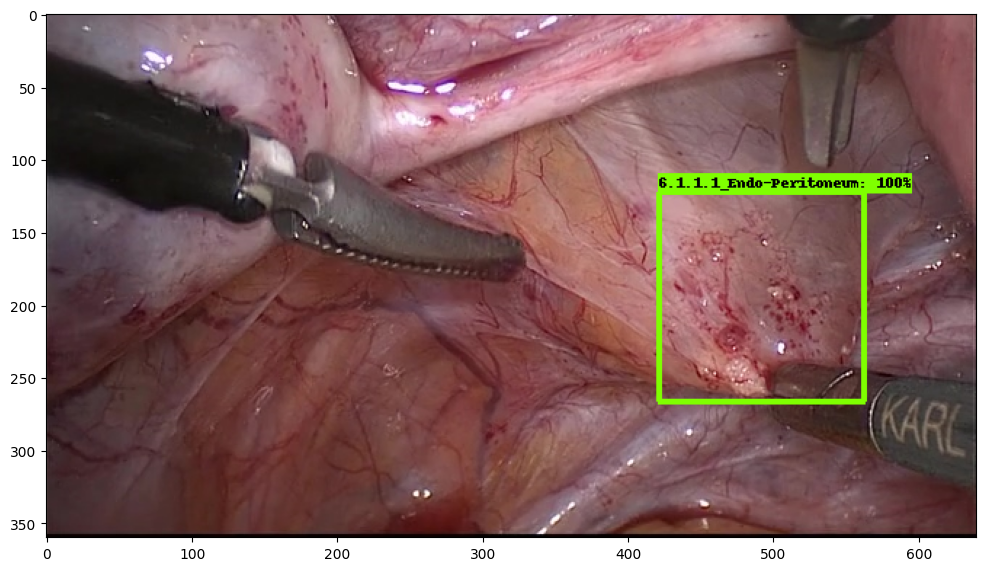

In [16]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('2_efficient_d0.jpg', bbox_inches='tight')

# Show the image
plt.show()


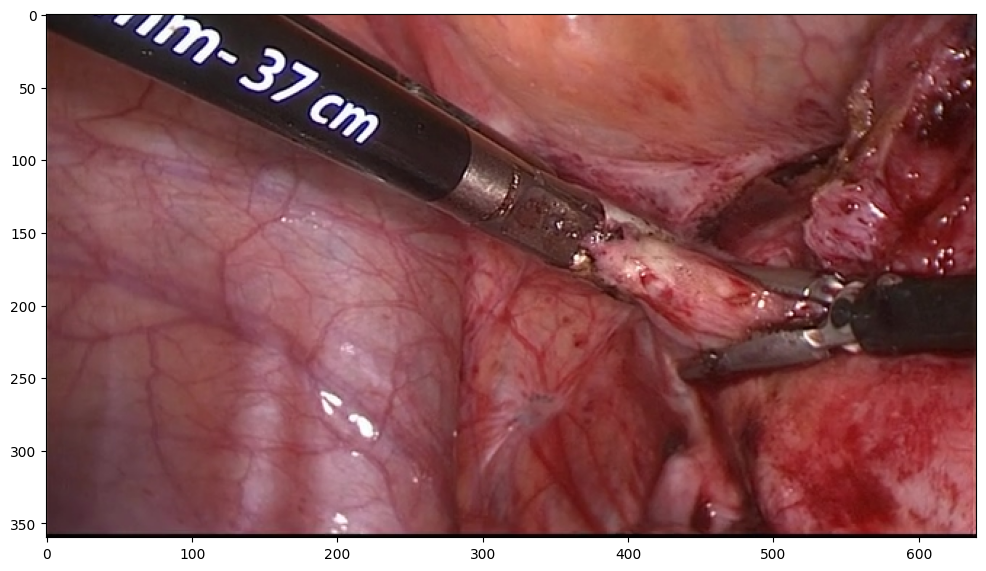

In [19]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('3_efficient_d0.jpg', bbox_inches='tight')

# Show the image
plt.show()


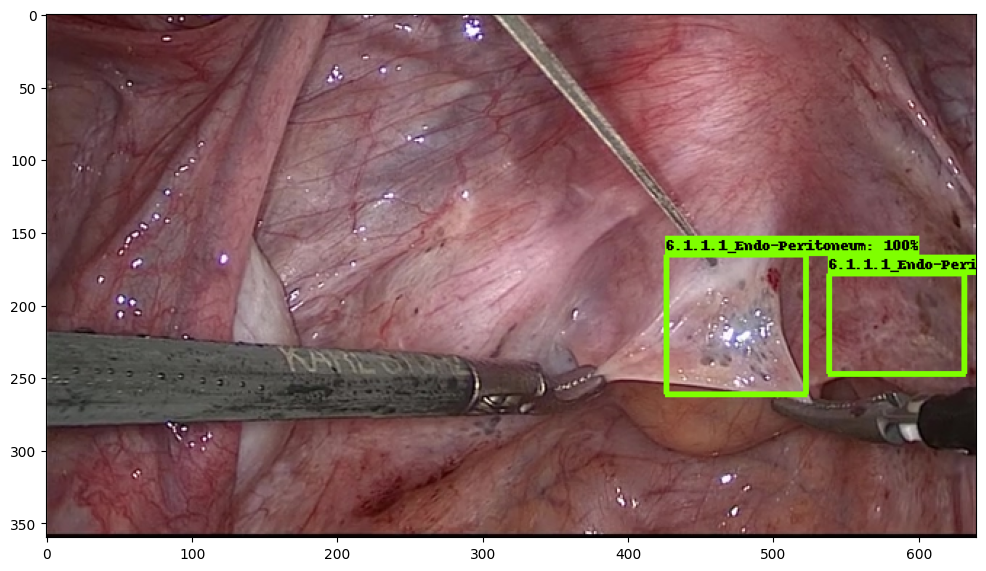

In [21]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('4_efficient_d0.jpg', bbox_inches='tight')

# Show the image
plt.show()


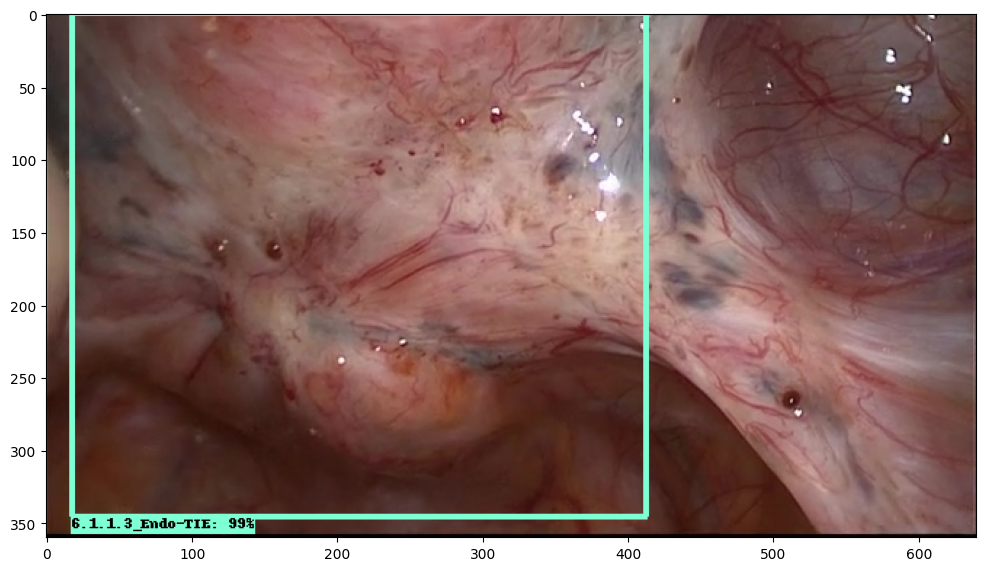

In [22]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('5_efficient_d0.jpg', bbox_inches='tight')

# Show the image
plt.show()


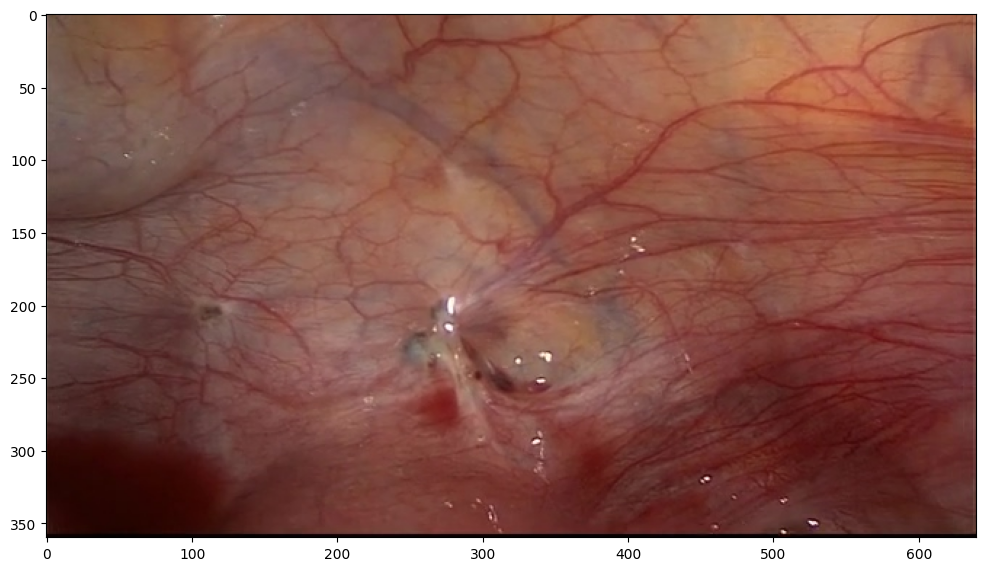

In [23]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('6_efficient_d0.jpg', bbox_inches='tight')

# Show the image
plt.show()


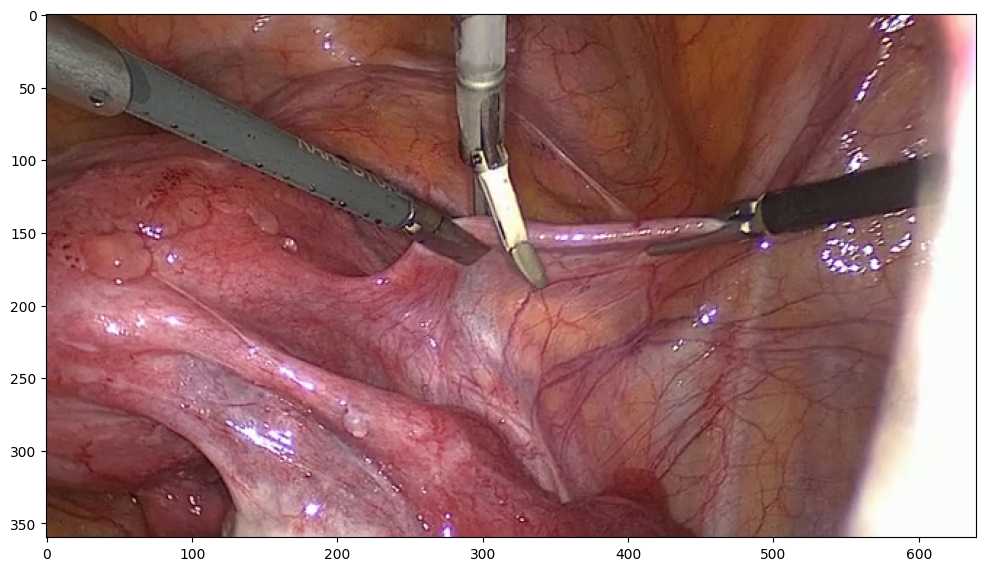

In [24]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('7_efficient_d0.jpg', bbox_inches='tight')

# Show the image
plt.show()


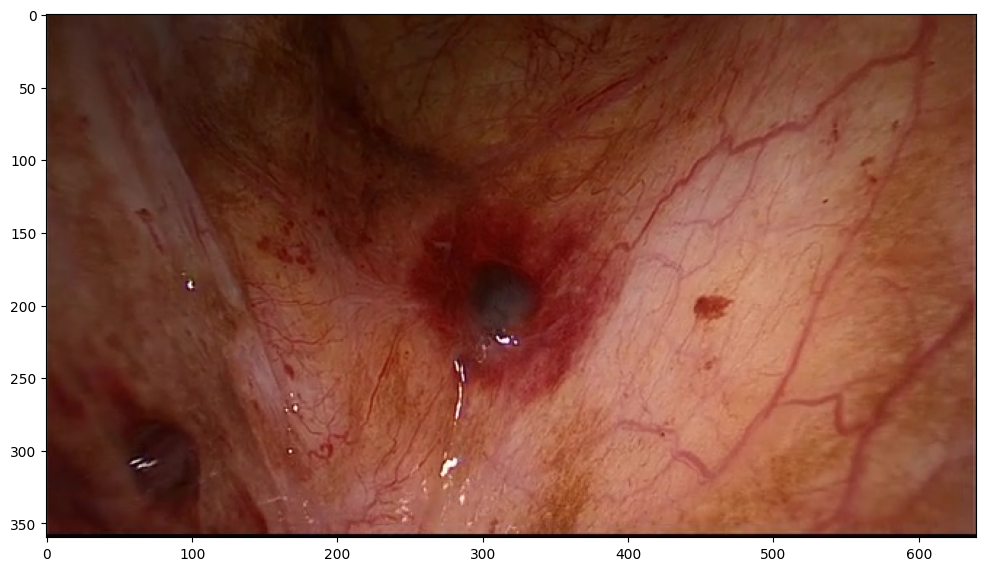

In [28]:
#running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)
plt.show()

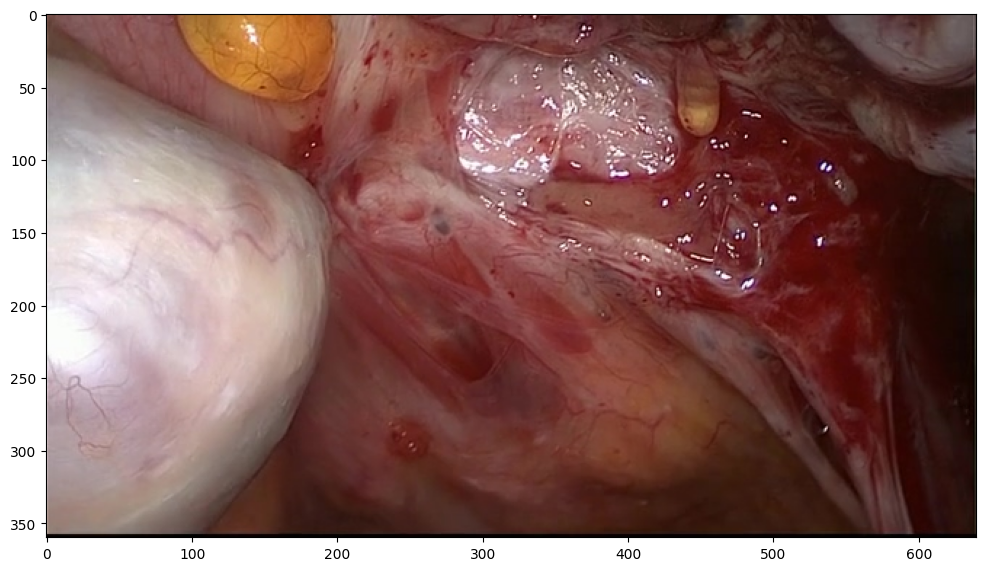

In [25]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('8_efficient_d0.jpg', bbox_inches='tight')

# Show the image
plt.show()


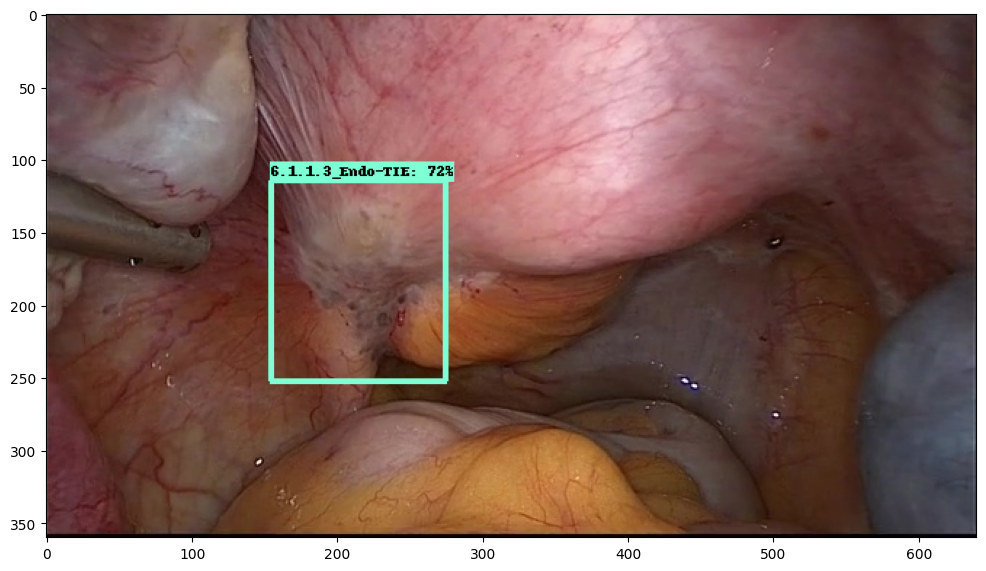

In [29]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('9_efficient_d0.jpg', bbox_inches='tight')

# Show the image
plt.show()


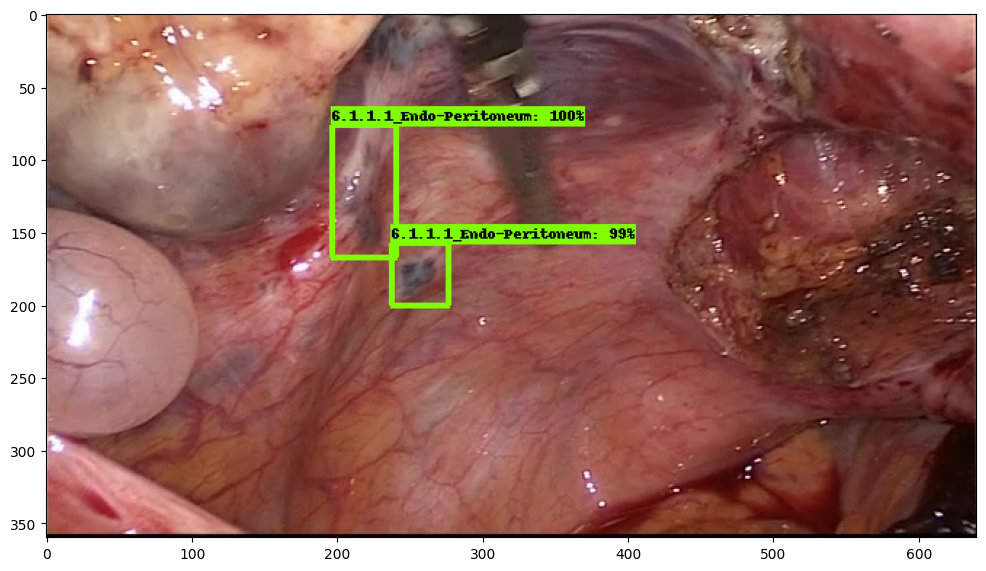

In [30]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('10_efficient_d0.jpg', bbox_inches='tight')

# Show the image
plt.show()


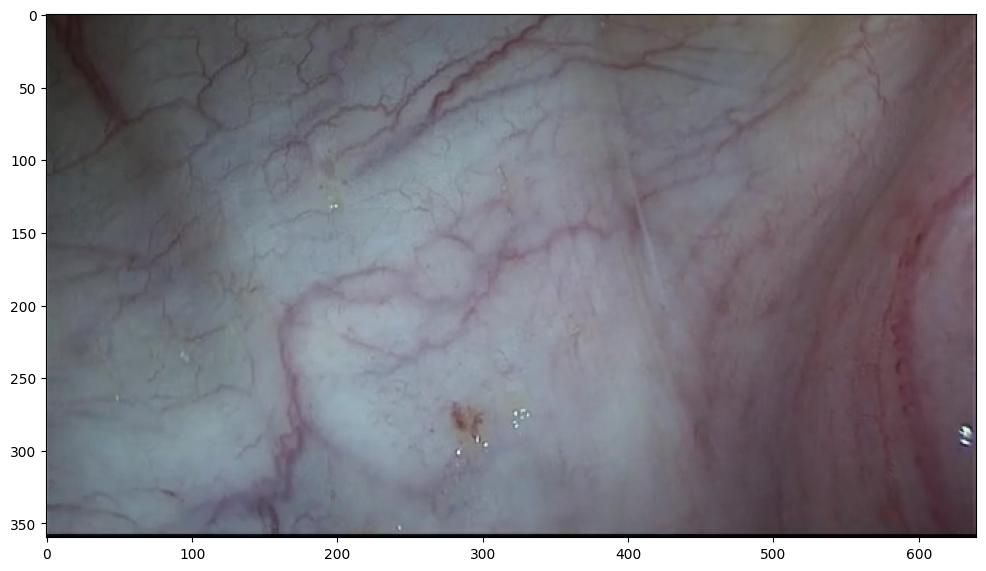

In [35]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('11_efficient_d0.jpg', bbox_inches='tight')

# Show the image
plt.show()


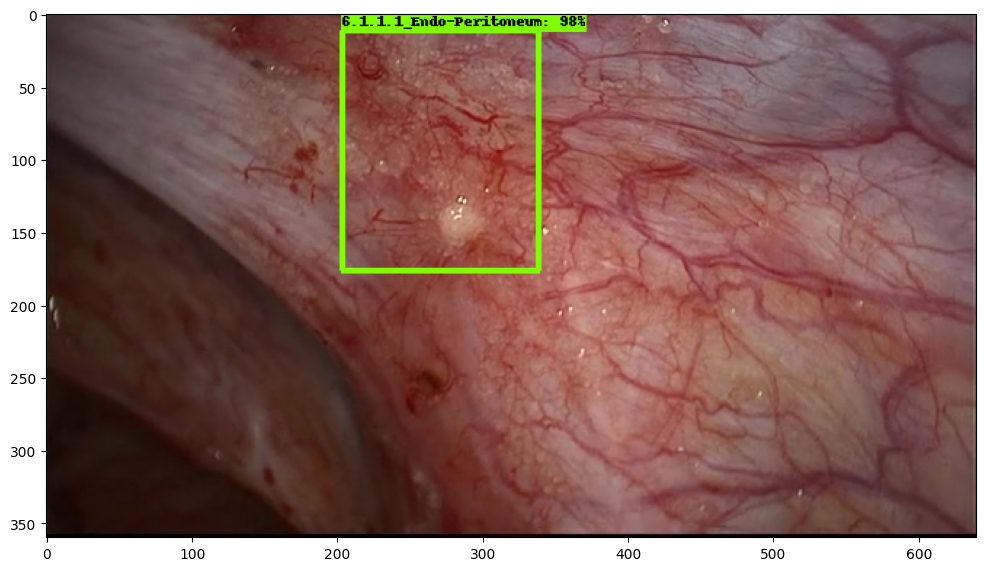

In [37]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('12_efficient_d0.jpg', bbox_inches='tight')

# Show the image
plt.show()


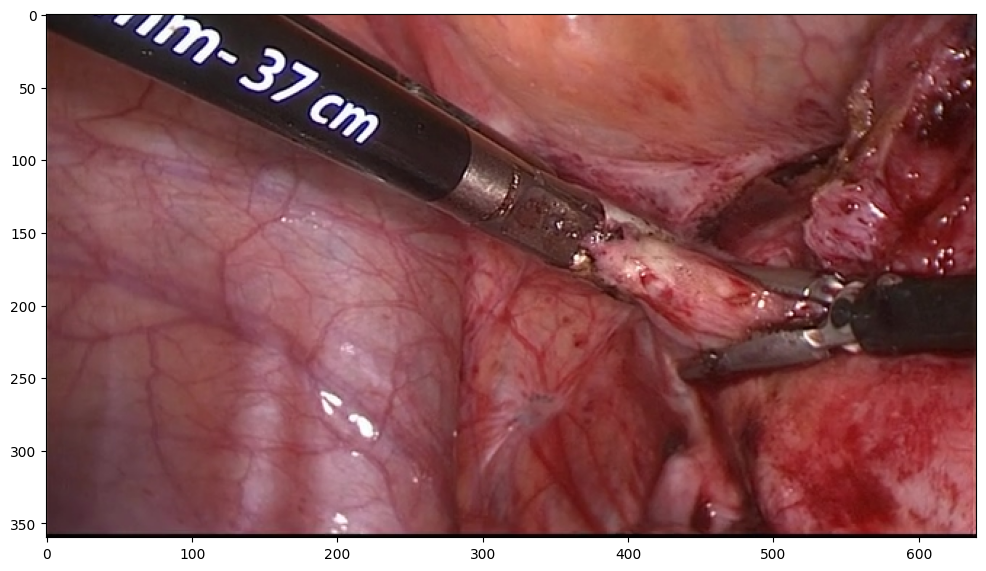

In [39]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('13_efficient_d0.jpg', bbox_inches='tight')

# Show the image
plt.show()


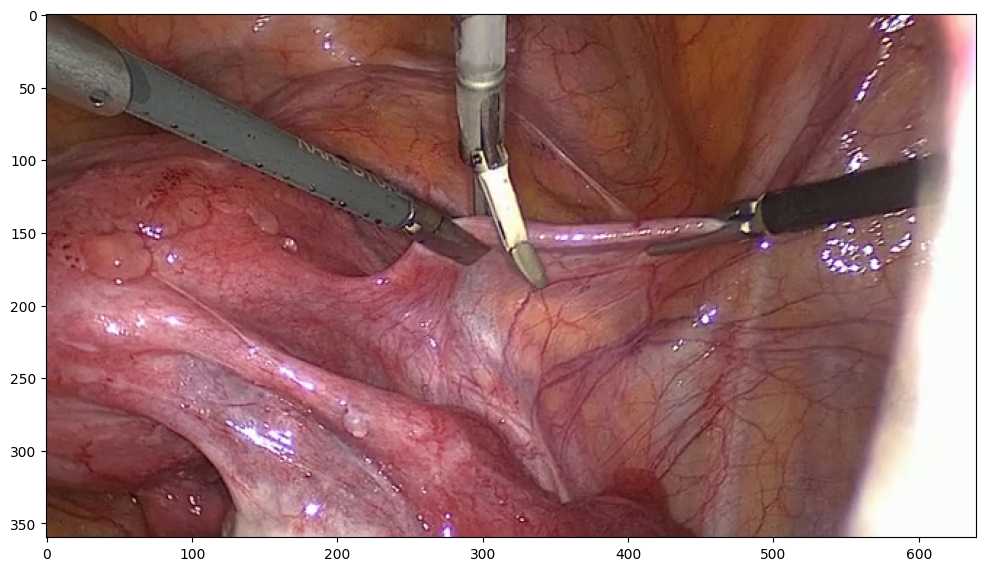

In [41]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('14_efficient_d0.jpg', bbox_inches='tight')

# Show the image
plt.show()


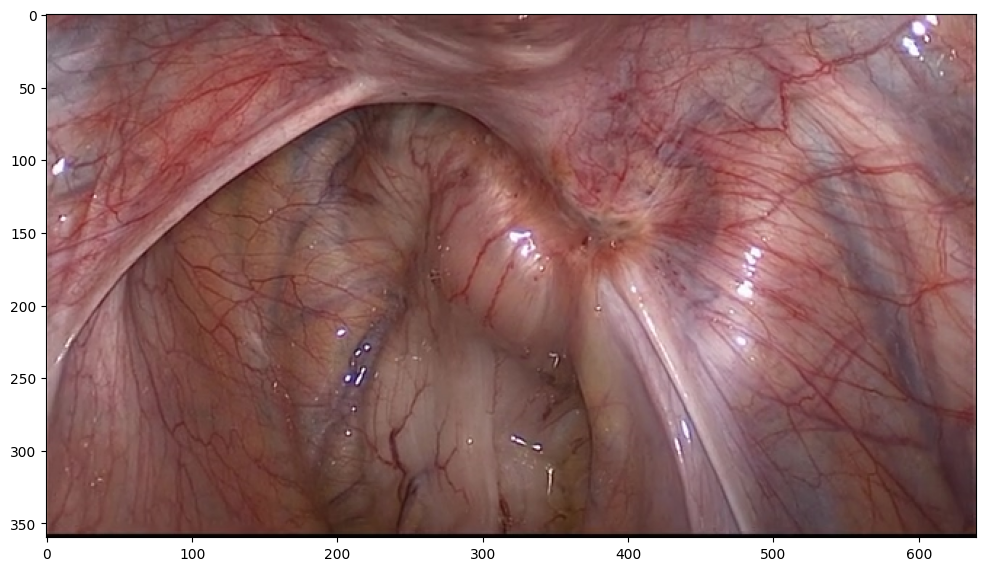

In [43]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('15_efficient_d0.jpg', bbox_inches='tight')

# Show the image
plt.show()


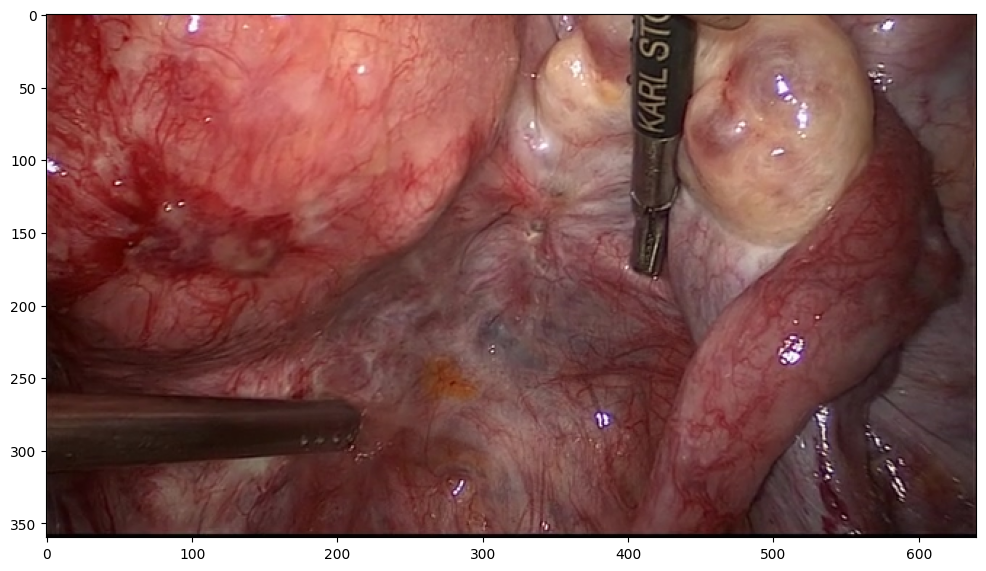

In [44]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('16_efficient_d0.jpg', bbox_inches='tight')

# Show the image
plt.show()


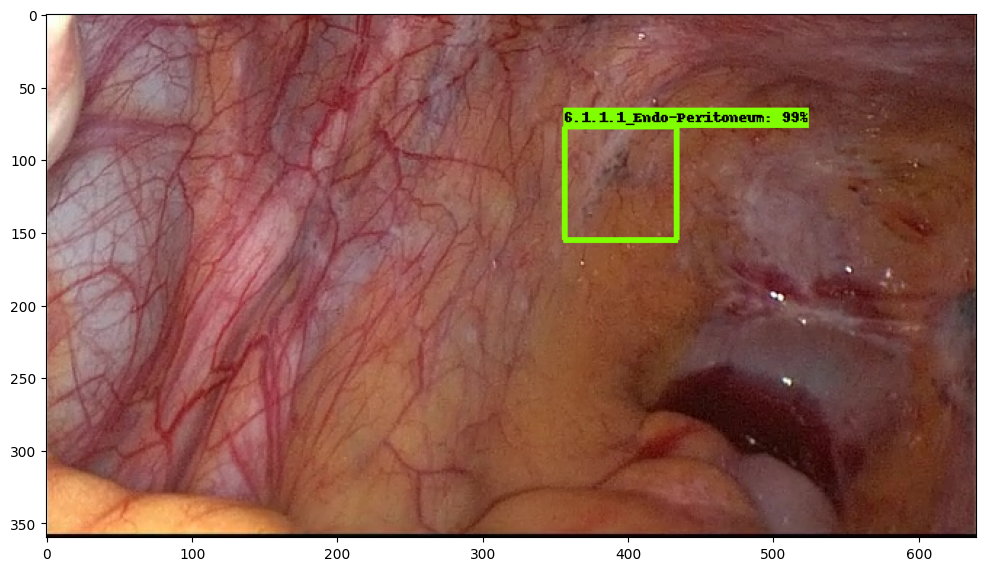

In [49]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('17_efficient_d0.jpg', bbox_inches='tight')

# Show the image
plt.show()


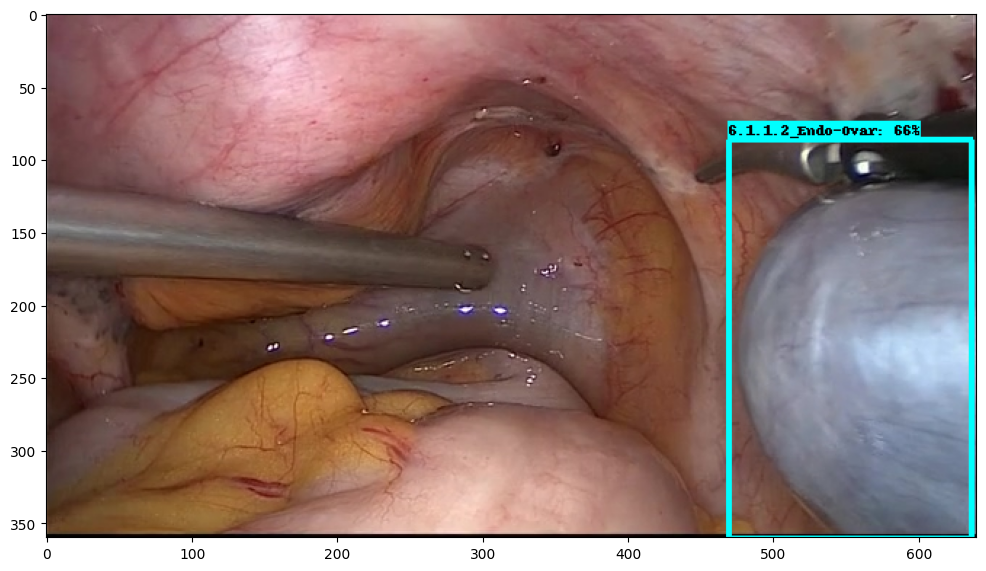

In [60]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('18_efficient_d0.jpg', bbox_inches='tight')

# Show the image
plt.show()


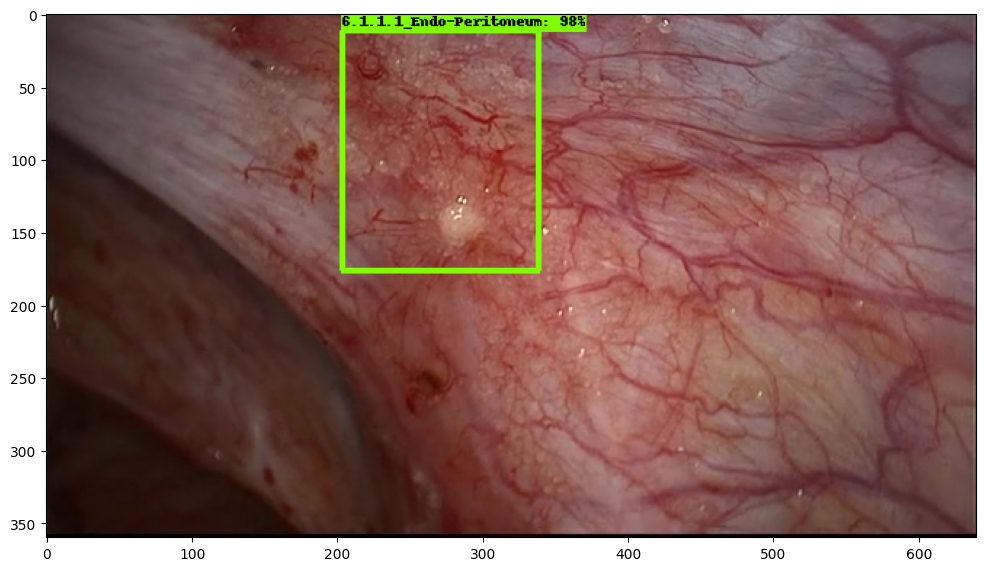

In [56]:
#running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)
plt.show()

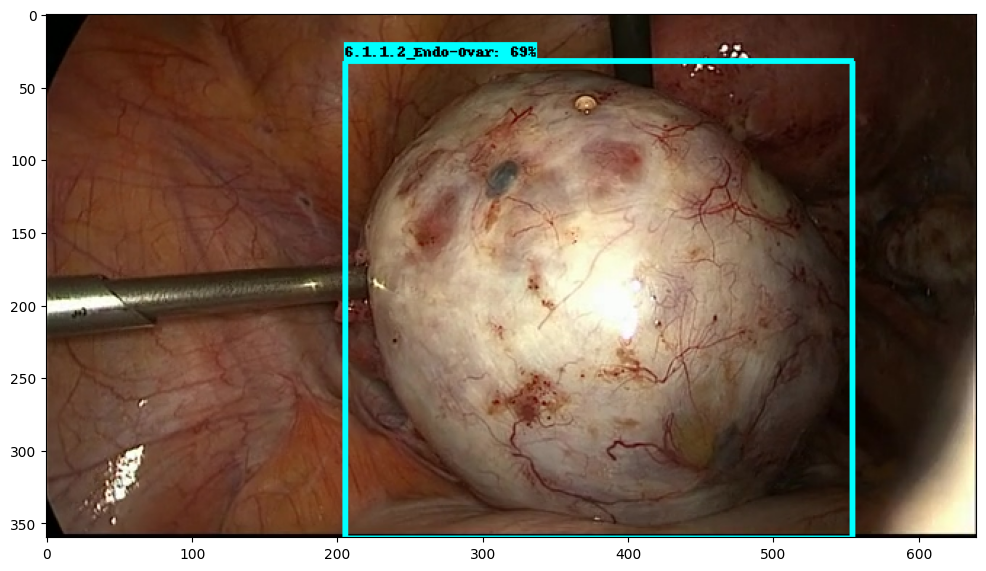

In [65]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('1_efficient_d0.jpg', bbox_inches='tight')

# Show the image
plt.show()


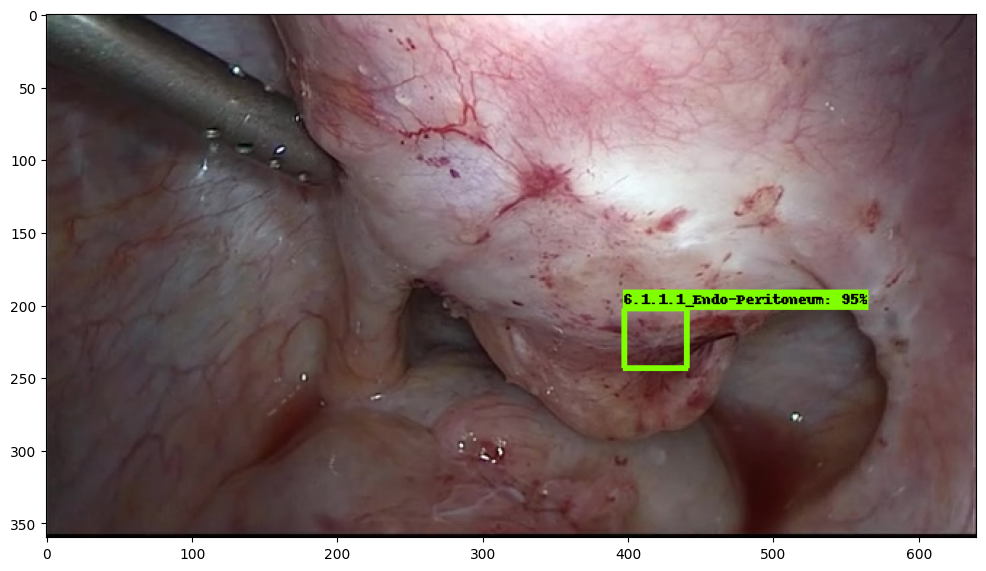

In [61]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('19_efficient_d0.jpg', bbox_inches='tight')

# Show the image
plt.show()


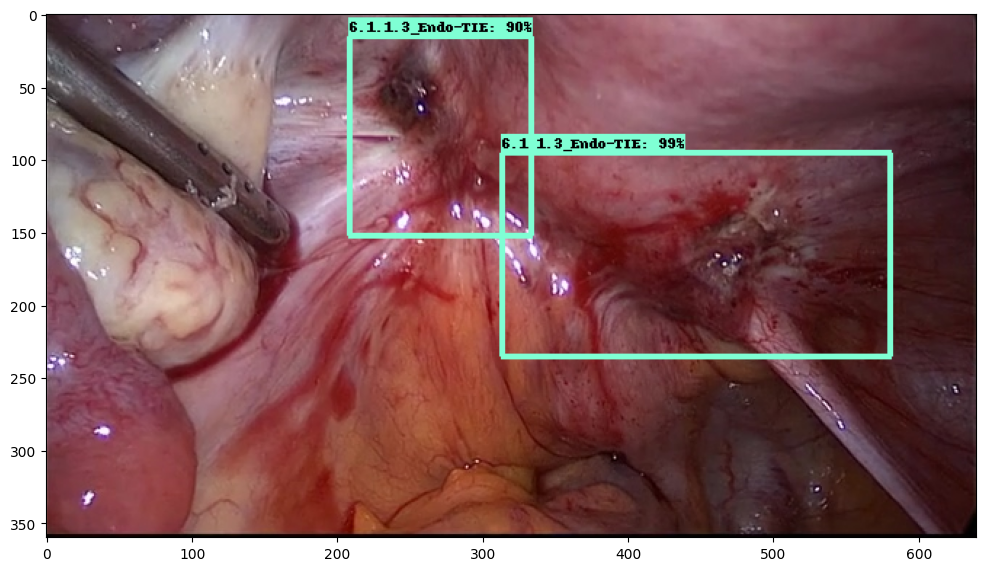

In [64]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('20_efficient_d0.jpg', bbox_inches='tight')

# Show the image
plt.show()


### EXTRACTING THE GROUNDTRUTH IMAGES FROM AND SAVING THEM IN THE DIRECTORY TO SAVE MEMORY

In [84]:

# Load the annotations file
with open('/home/759635/Glenda_v1.5_classes/test_coco.json') as f:
    ground_truth_data = json.load(f)

# Create a mapping from file name to image id
file_name_to_id = {image['file_name']: image['id'] for image in ground_truth_data['images']}

# Directory where you want to save the images
save_dir = '/home/759635/Glenda_v1.5_classes/ground_truth_images'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# Loop through each test image, draw ground truth boxes, and save the images
for image_path in TEST_IMAGE_PATHS:
    # Load the image
    image_np = load_image_into_numpy_array(image_path)
    
    # Extract image id from the image file name
    file_name = os.path.basename(image_path)
    image_id = file_name_to_id[file_name]
    
    # Get ground truth boxes and classes
    gt_boxes, gt_classes = get_ground_truth_for_image(image_id, ground_truth_data)
    
    # Draw ground truth boxes on the image
    fig, ax = plt.subplots(1, figsize=(12, 9))
    ax.imshow(image_np)

    # Draw each bounding box
    for box in gt_boxes:
        ymin, xmin, ymax, xmax = box
        rect = patches.Rectangle((xmin * image_np.shape[1], ymin * image_np.shape[0]),
                                 (xmax - xmin) * image_np.shape[1],
                                 (ymax - ymin) * image_np.shape[0],
                                 linewidth=4, edgecolor='g', facecolor='none')
        ax.add_patch(rect)
    
    plt.axis('off')  # Removes axis since we're interested in the image itself
    plt.savefig(os.path.join(save_dir, file_name), bbox_inches='tight')
    plt.close(fig)  # Close the figure to free memory

    print(f"Image {file_name} processed and saved to {save_dir}")

Image c_50_v_(video_1589.mp4)_f_220.jpg processed and saved to /home/759635/Glenda_v1.5_classes/ground_truth_images
Image c_93_v_(video_2824.mp4)_f_283.jpg processed and saved to /home/759635/Glenda_v1.5_classes/ground_truth_images
Image c_6_v_(video_89.mp4)_f_511.jpg processed and saved to /home/759635/Glenda_v1.5_classes/ground_truth_images
Image c_31_v_(video_1002.mp4)_f_499.jpg processed and saved to /home/759635/Glenda_v1.5_classes/ground_truth_images
Image c_14_v_(video_401.mp4)_f_90.jpg processed and saved to /home/759635/Glenda_v1.5_classes/ground_truth_images
Image c_99_v_(video_2998.mp4)_f_256.jpg processed and saved to /home/759635/Glenda_v1.5_classes/ground_truth_images
Image c_16_v_(video_471.mp4)_f_220.jpg processed and saved to /home/759635/Glenda_v1.5_classes/ground_truth_images
Image c_46_v_(video_1406.mp4)_f_426.jpg processed and saved to /home/759635/Glenda_v1.5_classes/ground_truth_images
Image c_23_v_(video_674.mp4)_f_870.jpg processed and saved to /home/759635/Gle